<a href="https://colab.research.google.com/github/rok-ansh/Computer-Vision-YOLO8NAS/blob/main/YOLO8NAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Yolo - You Only Look Once

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [5]:
import os
if not os.path.isdir('yolonas'):
  os.makedirs('yolonas')

In [3]:
import os
%cd yolonas


/content/drive/MyDrive/yolonas


In [4]:
os.getcwd()

'/content/drive/MyDrive/yolonas'

In [5]:
!pip install super-gradients

In [6]:
import super_gradients

The console stream is logged into /root/sg_logs/console.log


[2024-04-27 16:04:02] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-04-27 16:04:07] INFO - utils.py - NumExpr defaulting to 2 threads.


In [7]:
# in super-gradients they used COCO data -  33 millions of data
yolo_nas = super_gradients.training.models.get("yolo_nas_l", pretrained_weights = 'coco')
yolo_nas

[2024-04-27 16:04:15] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-04-27 16:04:15] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:06<00:00, 40.1MB/s]
[2024-04-27 16:04:22] INFO - checkpoin

YoloNAS_L(
  (backbone): NStageBackbone(
    (stem): YoloNASStem(
      (conv): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        )
        (branch_1x1): Conv2d(3, 48, kernel_size=(1, 1), stride=(2, 2))
        (post_bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (rbr_reparam): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
    )
    (stage1): YoloNASStage(
      (downsample): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=Tr

[2024-04-27 16:04:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


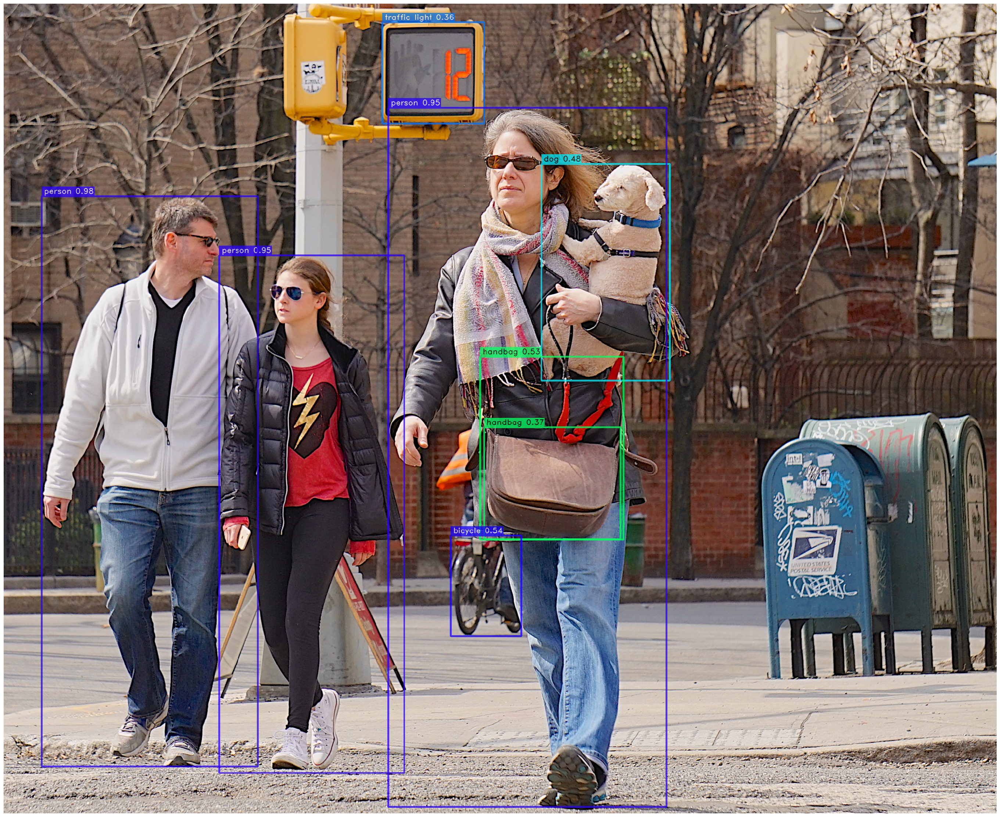

In [8]:
# Always give confidence less

url = "/content/17214488690_d81a0ee584_o.jpg"
yolo_nas.predict(url, conf = 0.10).show()

[2024-04-27 16:05:02] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


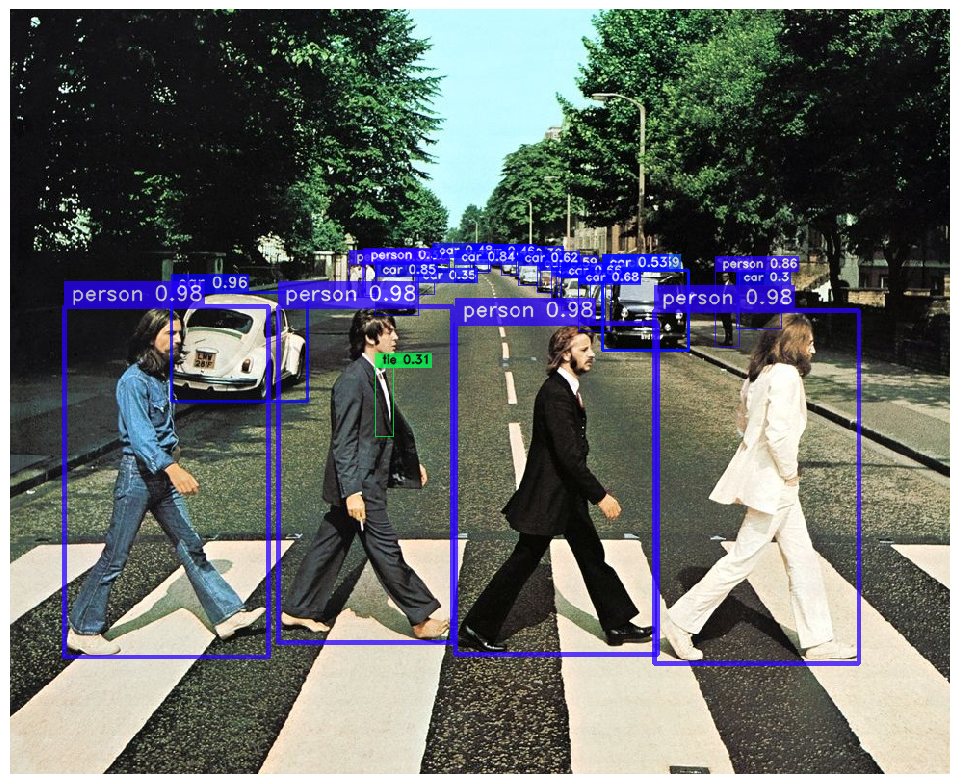

In [9]:
url = "/content/beatles-abbeyroad.jpg"
yolo_nas.predict(url, conf=0.25).show()

In [11]:
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [15]:
input_video_path = f"/content/small_video.mp4"
output_video_path = "/content/drive/MyDrive/yolonas/my_small_video_yo.mp4"

In [16]:
yolo_nas.to(device).predict(input_video_path, conf=0.1).save(output_video_path)

Processing Video:  98%|█████████▊| 728/743 [00:40<00:00, 36.44it/s]